In [2]:
from lcmap.client import Client

In [3]:
client = Client()

In [4]:
import matplotlib.pyplot as plt
import matplotlib.colors as mc
import matplotlib.cm as cm
import matplotlib.dates as mdates
import skimage.exposure as ex
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [6]:
import numpy as np
from itertools import groupby

def get_tiles(bands, x1, y1, x2, y2, t1, t2):
    xs = range(x1, x2,  256*30)
    ys = range(y1, y2, -256*30)
    results = []
    for band in bands:
        for x in xs:
            for y in ys:
                _, tiles = client.data.surface_reflectance.tiles(band, x, y, t1, t2)
                results.append(tiles)
    return results

def meld(ts, ix):
    ts = [t[ix] for t in ts]
    bands = []
    for band, by_band in groupby(ts, key=lambda t: t.ubid):
        rows = []
        foo = sorted(by_band, key=lambda t: t.y, reverse=True)
        for x, by_row in groupby(foo, key=lambda t: t.y):
            bar = sorted(by_row, key=lambda t: t.x)
            data = [t.data for t in bar]
            rows.append(np.hstack(data))
        bands.append(np.vstack(rows))
    return np.dstack(bands)

In [8]:
bands = ["LANDSAT_5/TM/sr_band3", "LANDSAT_5/TM/sr_band2", "LANDSAT_5/TM/sr_band1"]
x1, y1 = -1984420, 2987547 #... not a tile boundary!
x2, y2 = x1+(256*30)*2+1, y1-(256*30)-1
t1, t2 = '2005-06-01', '2006-06-01'
tiles = get_tiles(bands, x1, y1, x2, y2, t1, t2)

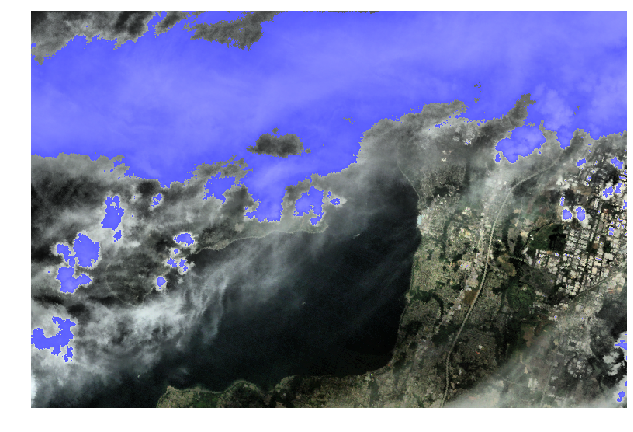

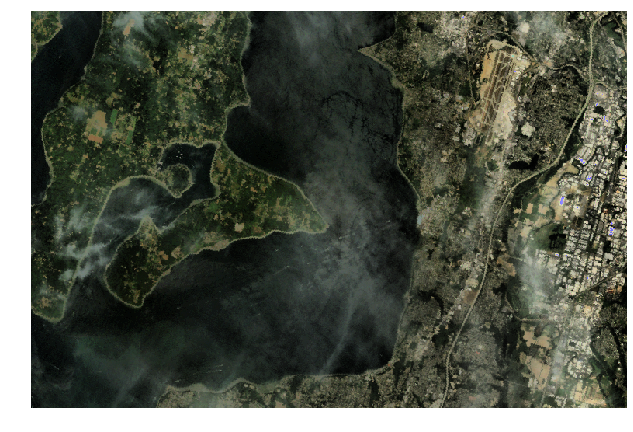

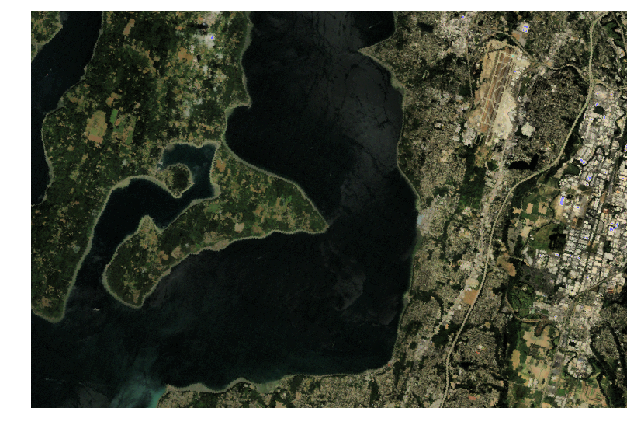

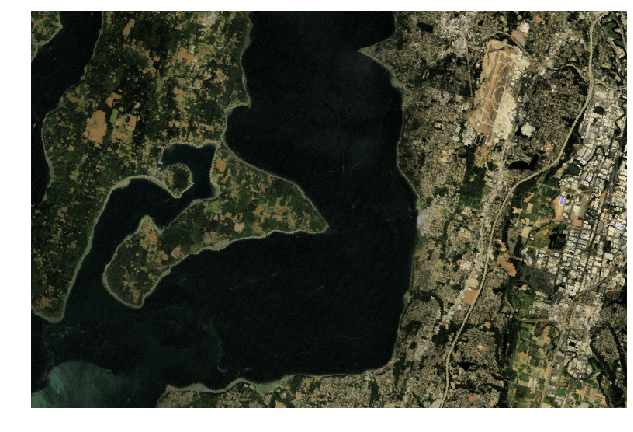

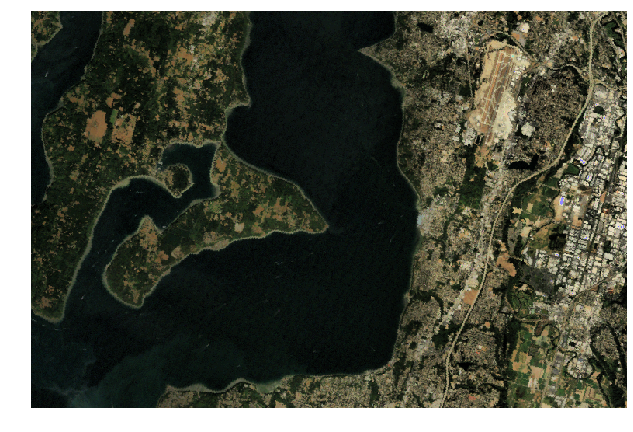

...

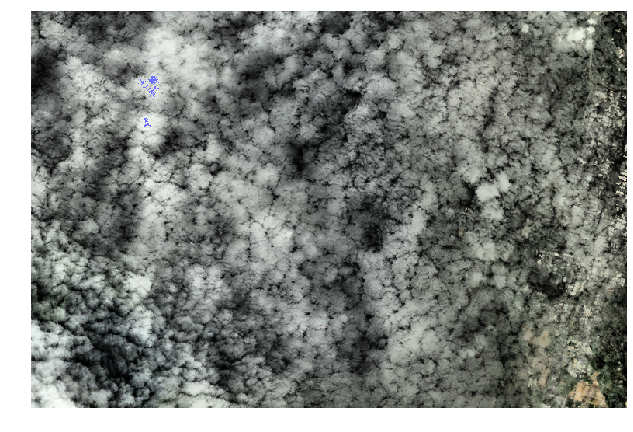

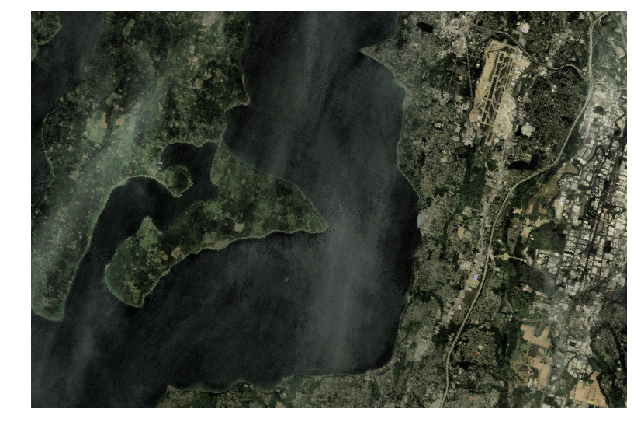

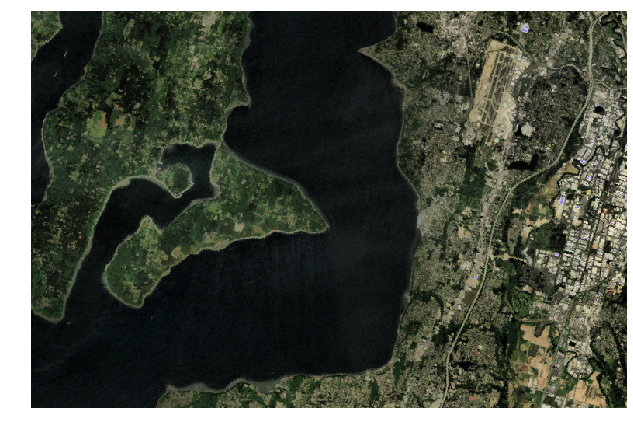

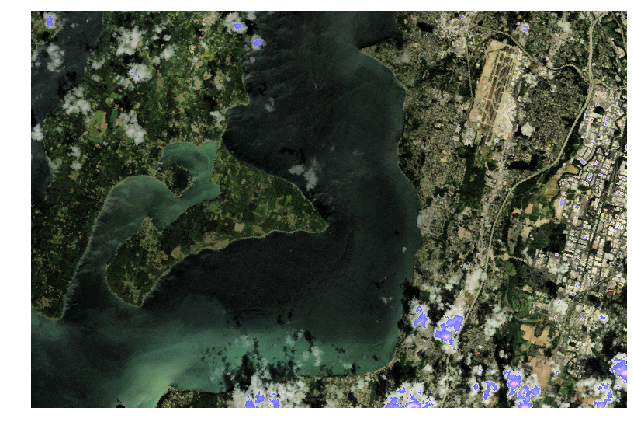

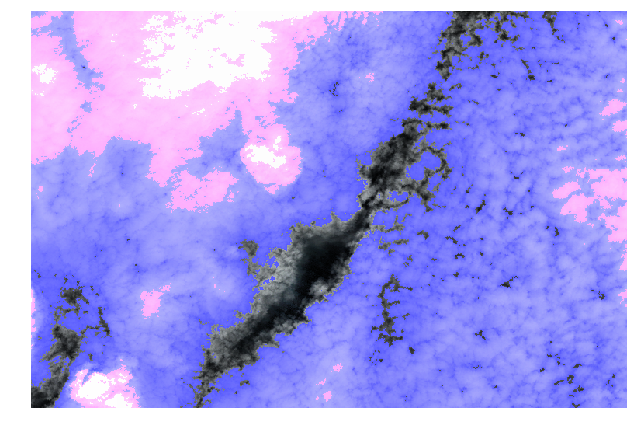

In [9]:
fig = plt.figure(figsize=(36, 36))
ppi = 72 # pixels per inch
for ix in range(0, len(tiles[0])):
    # ax = fig.add_subplot(6,6,ix+1)
    rgb = meld(tiles, ix)
    norm = mc.Normalize(0.0, 1.0, clip=True)
    rgb_ah = ex.equalize_adapthist(norm(rgb), clip_limit=0.03)
    py, px, pz = rgb.shape
    plt.figure(figsize=(px/ppi, py/ppi))
    plt.axis('off')
    plt.imshow(rgb_ah, interpolation='nearest')